In [23]:
import torch
import numpy as np
from torch import nn
from torchvision import transforms
import matplotlib.pyplot as plt
import PIL.Image
from matplotlib import animation
from IPython.display import HTML

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device: {}".format(device))

Using device: cuda


Zainspirowane z https://github.com/ndahlquist/pytorch-fourier-feature-networks/blob/master/demo.ipynb

In [24]:
def get_image():
    """Returns a PIL image"""

    image_path = "src/cat.jpg"
    img = PIL.Image.open(image_path)

    return img

def build_frames(images):
    """Converts a list of images to a list of frames"""

    frames = []
    
    for image in images:
        image = image.transpose(1, 2, 0)
        image = np.clip(image, 0, 1)
        frames.append((image * 255).astype(np.uint8))

    return frames

def display_animation(frames, fps=30, path=None):
    """Displays an animation of the given frames

    Args:
        frames (list): List of frames to animate
        fps (int, optional): Frames per second. Defaults to 30.
        path (str, optional): Path to save the animation. Defaults to None.

    Returns:
        HTML: HTML object to display the animation in Jupyter Notebook
    """

    fig = plt.figure()
    ims = [[plt.imshow(frame, animated=True)] for frame in frames]
    ani = animation.ArtistAnimation(fig, ims, interval=1000/fps, blit=True, repeat_delay=1000)

    if path:
        ani.save(path, writer='imagemagick')

    html = HTML(ani.to_jshtml())
    plt.close()
    return html

# Image transformation
image_transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor(),
])

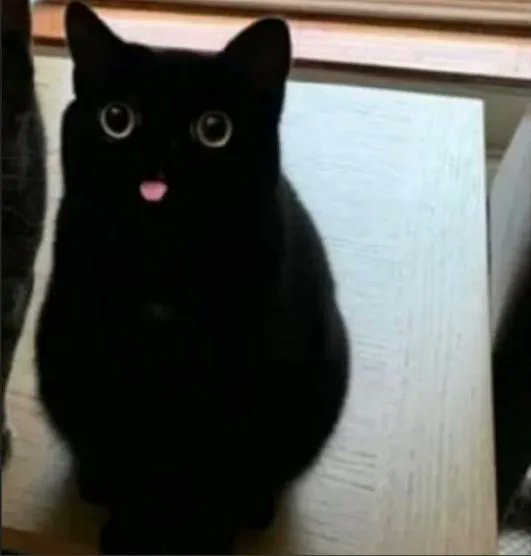

xy_grid shape: torch.Size([1, 2, 512, 512])


In [25]:
# Load image
image = get_image()
image.show()
target = image_transform(image).unsqueeze(0).to(device)

# Display target image
coords = np.linspace(0, 1, 512, endpoint=False)
x_coords, y_coords = np.meshgrid(coords, coords)
xy_grid = np.stack([x_coords, y_coords], axis=-1)
xy_grid = torch.from_numpy(xy_grid).permute(2, 0, 1).unsqueeze(0).float().to(device)
print("xy_grid shape: {}".format(xy_grid.shape))

# Model

Nasz model to wielowarstwowy perceptron oparty na współrzędnych. W tym przykładzie, dla każdej współrzędnej obrazu wejściowego $(x,y)$, model przewiduje powiązany kolor $(r,g,b)$.

<br>
<div style="display: flex; justify-content: center;">
<img src="https://user-images.githubusercontent.com/3310961/85066930-ad444580-b164-11ea-9cc0-17494679e71f.png" width="600" />
</div>

**Uwaga**: używamy zwojów 2D, ale ponieważ mają one rozmiar jądra (1, 1), działają jak konwolucje "punktowe". Jest to równoważne gęsto połączonemu perceptronowi wielowarstwowemu dla każdej współrzędnej.
Używamy również batchnorm, aby przyspieszyć zbieżność.

In [26]:
class ConvNet(nn.Module):
    def __init__(self, input_size, hidden_size=256, output_size=3):
        super(ConvNet, self).__init__()

        self.conv_block1 = self._conv_block(input_size, hidden_size, kernel_size=1, padding=0)
        self.conv_block2 = self._conv_block(hidden_size, hidden_size, kernel_size=1, padding=0)
        self.conv_block3 = self._conv_block(hidden_size, hidden_size, kernel_size=1, padding=0)

        self.conv4 = nn.Conv2d(hidden_size, output_size, kernel_size=1, padding=0)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.conv_block1(x)
        x = self.conv_block2(x)
        x = self.conv_block3(x)

        return self.sigmoid(self.conv4(x))

    def _conv_block(self, in_channels, out_channels, kernel_size=1, padding=0):
        return nn.Sequential(
            nn.Conv2d(
                in_channels,
                out_channels,
                kernel_size=kernel_size,
                padding=padding),
            nn.ReLU(),
            nn.BatchNorm2d(out_channels),
        )


def train(model, input, target, epochs=800, lr=1e-4):
    """Trains the given model

    Args:
        model (nn.Module): Model to train
        input (torch.Tensor): Input tensor
        target (torch.Tensor): Target tensor
        epochs (int, optional): Number of epochs. Defaults to 800.
        lr (float, optional): Learning rate. Defaults to 1e-4.

    Returns:
        list: List of images generated by the model during training
    """

    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    criterion = nn.MSELoss()

    images = []

    for i in range(epochs):
        optimizer.zero_grad()
        output = model(input)
        loss = criterion(output, target)
        loss.backward()
        optimizer.step()

        if i % 25 == 0:
            images.append(output[0].detach().cpu().numpy())

        if i % 100 == 0:
            print(f"Epoch: {i}, Loss: {loss.item()}")

    print(f"Epoch: {epochs}, Loss: {loss.item()}")

    return images

## MLP z wejściem (x,y)

In [27]:
model = ConvNet(input_size=2).to(device)
images_xy = train(model, xy_grid, target, epochs=600, lr=1e-4)

Epoch: 0, Loss: 0.1663154810667038
Epoch: 100, Loss: 0.03481810539960861
Epoch: 200, Loss: 0.019535649567842484
Epoch: 300, Loss: 0.00973198376595974
Epoch: 400, Loss: 0.006139676086604595
Epoch: 500, Loss: 0.004839012399315834
Epoch: 600, Loss: 0.00415235199034214


In [28]:
frames = build_frames(images_xy)
display_animation(frames, fps=4, path="animation_xy.gif")

MovieWriter imagemagick unavailable; using Pillow instead.


## MLP z wejściem przetworzonym przez furier feature
Tensor wejściowy $x$ do sieci jest ładowany z zapisanego pliku, ponieważ waszym zadaniem będzie zaimplementowanie funkcji furier feature. To aby nie spoilerować, nie będziemy pokazywać jak to zrobić :)

In [29]:
model = ConvNet(input_size=256).to(device)

# load the tensor from a file
x = torch.load('src/input_with_furier_transform.pt').to(device)

images_furier = train(model, x, target, epochs=600, lr=1e-4)

Epoch: 0, Loss: 0.1765088140964508
Epoch: 100, Loss: 0.017471451312303543
Epoch: 200, Loss: 0.006551915314048529
Epoch: 300, Loss: 0.004462293349206448
Epoch: 400, Loss: 0.0034554260782897472
Epoch: 500, Loss: 0.002886971225962043
Epoch: 600, Loss: 0.0025320840068161488


In [30]:
frames = build_frames(images_furier)
display_animation(frames, fps=4, path="animation_furier.gif")

MovieWriter imagemagick unavailable; using Pillow instead.
